In [1]:
# Load libraries

import os
import warnings
import unicodedata

import geopandas as gpd
import numpy as np
import pandas as pd
import pygeos
import osmnx as ox
import esda.shape as shape
import matplotlib.pyplot as plt

# Turn interactive plotting off
plt.ioff()

from tqdm import tqdm

from scipy.signal import argrelmin, find_peaks, argrelextrema
# from sklearn.neighbors import KernelDensity
from scipy.stats import gaussian_kde
from KDEpy import FFTKDE

/Users/anvy/opt/anaconda3/envs/OSMNX/lib/python3.9/site-packages/requests/__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


@ martin: 
* how to branch now?
* pop over 100.000?
* KDE: has to have nonnegative values


reading in data including the FUA code:

In [2]:
# Read in data

# METADATA
sample = gpd.read_parquet("../data/sample.parquet")
sample["eFUA_ID"] = sample["eFUA_ID"].astype(int)

def makefua_gdf(myfua):
    myfua = int(myfua)
    gdf = gpd.read_parquet(f"../data/{myfua}/polygons/")
    gdf["fua"] = myfua
    return (gdf)

all_poly_data = pd.concat([makefua_gdf(fua) for fua in sample.eFUA_ID])
all_poly_data = all_poly_data.reset_index(drop = True)
all_poly_data.tail()

,geometry,area,reock,shape_index,isoperimetric_quotient,isoareal_quotient,radii_ratio,diameter_ratio,boundary_amplitude,squareness,schumm_shape_index,fua
4785869,"POLYGON ((664550.488 4277882.914, 664724.160 4...",2015.828523,0.085015,13.091050,0.184343,0.429352,0.290637,0.068801,1.0,0.234713,0.290637,3652
4785870,"POLYGON ((664724.694 4277876.791, 664724.160 4...",2415.457536,0.076255,13.571670,0.170067,0.412392,0.275256,0.060555,1.0,0.216536,0.275256,3652
4785871,"POLYGON ((664727.104 4277827.945, 664722.888 4...",247.652905,0.207763,7.173086,0.450327,0.671064,0.454347,0.193084,1.0,0.573375,0.454347,3652
4785872,"POLYGON ((664548.225 4277746.373, 664514.134 4...",266.266917,0.232871,7.874372,0.443792,0.666178,0.481017,0.193879,1.0,0.565054,0.481017,3652
4785873,"POLYGON ((664557.097 4277748.566, 664555.373 4...",66.547394,0.609369,6.368037,0.775533,0.880644,0.778114,0.771124,1.0,0.987440,0.778114,3652


In [3]:
apd = all_poly_data.copy()

In [4]:
citynames = dict(zip(sample["eFUA_ID"], sample["eFUA_name"]))
fuakeys = dict(zip(sample["eFUA_name"], sample["eFUA_ID"]))

### Remove negative areas (?)

In [5]:
apd[apd["area"]<0]

,geometry,area,reock,shape_index,isoperimetric_quotient,isoareal_quotient,radii_ratio,diameter_ratio,boundary_amplitude,squareness,schumm_shape_index,fua
2734170,"POLYGON ((397822.782 6183515.517, 397835.782 6...",-4.149551e+06,-0.003629,-122.706004,-0.000241,NaN,NaN,0.789748,0.232175,NaN,NaN,2262
2871351,"POLYGON ((489932.178 5457111.688, 489930.731 5...",-2.912773e+04,-0.022894,-25.823683,-0.023749,NaN,NaN,0.359517,0.666854,NaN,NaN,375
3170671,"POLYGON ((324140.340 4318068.840, 324150.044 4...",-3.137519e+01,-0.002802,-0.296501,-0.000667,NaN,NaN,0.389149,0.388053,NaN,NaN,7068


In [6]:
apd.drop(apd[apd["area"]<0].index, inplace = True)
apd = apd.reset_index(drop = True)

**** 
Do we want a cutoff for max area?

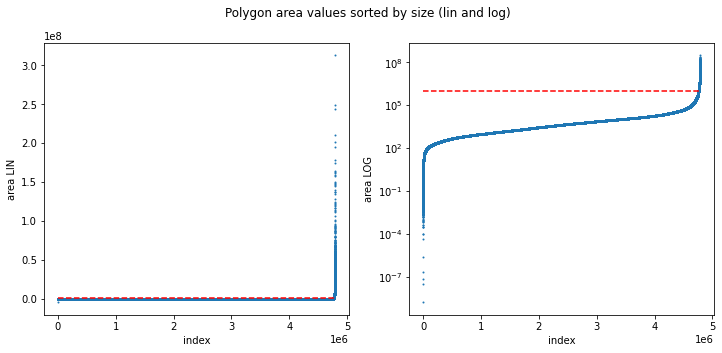

In [4]:
# OUTLIERS TO POTENTIALLY REMOVE

mycut = 10**6 # set cut off value

fig, ax = plt.subplots(1,2, figsize = (12,5))

# lin plot
ax[0].scatter(np.arange(len(apd)), sorted(apd["area"]), s = 1)
ax[0].set_xlabel("index")
ax[0].set_ylabel("area LIN")
ax[0].hlines(mycut, 0, len(apd), color = "red", linestyles="dashed")

# log plot
ax[1].scatter(np.arange(len(apd)), sorted(apd["area"]), s = 1)
ax[1].set_yscale("log")
ax[1].set_xlabel("index")
ax[1].set_ylabel("area LOG")
ax[1].hlines(mycut, 0, len(apd), color = "red", linestyles="dashed")

plt.suptitle("Polygon area values sorted by size (lin and log)");

maybe...
we don't need to cut this because the outliers will be filtered out by our bananas index anyways / by definition?
---> check max sizes of polygon areas below cutoff

****
do we want a cutoff for shape_index?

Text(0.5, 1.0, 'Area distribution below/above shape index = 200')

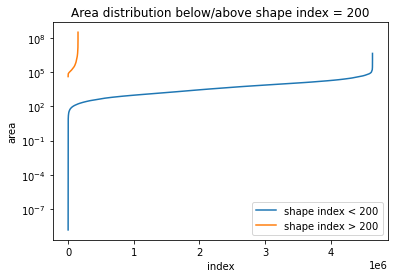

In [70]:
plt.plot(sorted(apd[apd["shape_index"]<200].area), label = "shape index < 200")
plt.plot(sorted(apd[apd["shape_index"]>200].area), label = "shape index > 200")
plt.xlabel("index")
plt.ylabel("area")
plt.yscale("log")
plt.legend()
plt.title("Area distribution below/above shape index = 200")

**********************  

**Finding maxminmax structure using:**
* [scipy.stats.gaussian_kde](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.gaussian_kde.html) for gaussian shaped kernel density estimation
* possibly adding non-parameteric bandwidth selector from [KDEpy](https://kdepy.readthedocs.io/en/latest/bandwidth.html)
* https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.argrelmin.html#scipy.signal.argrelmin
recommended: *find_peaks*


**Notes on particular cities:** 

* Comilla: whole province, few polygons in total
* Abbottabad: specific structure (long thin blocks)
* Chongqing, Luohe: mapped in a way that *all* streets have 2 lines instead of centerline --> only 1 max
* etc.

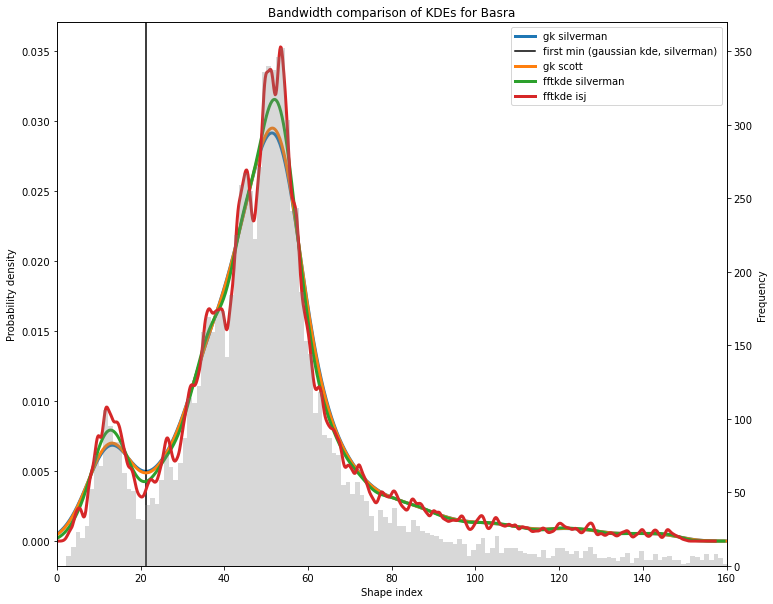

In [13]:
# # SAMPLE PROCEDURE (FOR 1 CITY)

# myfua = fuakeys['Basra']
# mycity = citynames[myfua]

# data = apd[apd["fua"]==myfua].shape_index.values
# data = data[data<150] # filter - using only values below 200

# fig, ax = plt.subplots(1,1,figsize=(10,5))

# gk = gaussian_kde(data, bw_method= "silverman")
# s = np.linspace(-5, 200, 1000)
# mypdf_s = gk.pdf(s)
# ax.plot(s, mypdf_s, label = "gk silverman", linewidth = 3)

# # peaks of gaussian kde with silverman bandwidth
# p = find_peaks(
#     -mypdf_s,
#     threshold = 0, 
#     distance = 10,
#     plateau_size = (0,10)
#     )

# first_min = s[p[0][0]]

# plt.axvline(
#     x = first_min, 
#     ymin = 0, 
#     ymax = 1, 
#     color = "black", 
#     label = "first min (gaussian kde, silverman)",
#     linestyle = "--")

# gk = gaussian_kde(data, bw_method= "scott")
# s = np.linspace(-5, 200, 1000)
# mypdf_s = gk.pdf(s)
# ax.plot(s, mypdf_s, label = "gk scott", linewidth = 3)

# x, y = FFTKDE(kernel='gaussian', bw='silverman').fit(data).evaluate()
# ax.plot(x, y, label = "fftkde silverman", linewidth = 3)

# x, y = FFTKDE(kernel='gaussian', bw='ISJ').fit(data).evaluate()
# ax.plot(x, y, label = "fftkde isj", linewidth = 3)

# # histogram plot
# ax2=ax.twinx()
# apd[apd["fua"]==myfua].shape_index.plot.hist(
#     ax = ax2, 
#     figsize=(12, 10), 
#     bins=2000, 
#     alpha = 0.3,
#     color = "grey")

# ax.set_xlim(0,160)
# ax.set_xlabel("Shape index")
# ax.set_ylabel("Probability density")
# ax.set_title("Bandwidth comparison of KDEs for " + mycity)
# ax.legend();

# # fig.savefig(f"../plots/kde-bw/{myfua}.png")

*****

In [27]:
### Computing and storing minima:

mins_scipy = []
mins_kdepy = []

for myfua in sample.eFUA_ID:
    
    data = apd[apd["fua"]==myfua].shape_index.values
    data = data[data<150] # filter - using only values below 150

    # scipy library, silverman method ---> PREFERRED ONE!
    gk = gaussian_kde(data, bw_method= "silverman")
    s = np.linspace(-5, 200, 1000)
    mypdf_s = gk.pdf(s)

    # peaks of gaussian kde with silverman bandwidth    
    p = find_peaks(
        -mypdf_s,
        threshold = 0, 
        distance = 5,
        plateau_size = (0,10)
        )

    if len(p[0])>0:
        first_min = s[p[0][0]]
    else:
        first_min = 0
    mins_scipy.append(first_min)
    
    # kdepy library, silverman method
    x, y = FFTKDE(kernel='gaussian', bw='silverman').fit(data).evaluate()

    # peaks of gaussian kde with silverman bandwidth    
    p = find_peaks(
        -y,
        threshold = 0, 
        distance = 5,
        plateau_size = (0,10)
        )

    if len(p[0])>0:
        first_min = x[p[0][0]]
    else:
        first_min = 0
    mins_kdepy.append(first_min)


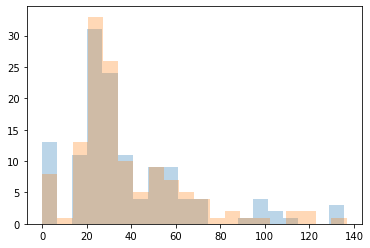

In [40]:
plt.hist(sorted(mins_scipy), bins = 20, alpha = 0.3);

plt.hist(sorted(mins_kdepy), bins = 20, alpha = 0.3);

In [41]:
# 2 dicts containing min values computed by different kde functions
mds = dict(zip(sample.eFUA_ID, mins_scipy))
mdk = dict(zip(sample.eFUA_ID, mins_kdepy))

********
plot results for each city:

In [44]:
for myfua in sample.eFUA_ID:
    
    mycity = citynames[myfua]

    data = apd[apd["fua"]==myfua].shape_index.values
    data = data[data<150] # filter - using only values below 150

    fig, ax = plt.subplots(1,1,figsize=(10,5))

    # scipy library, silverman method ---> PREFERRED ONE!
    gk = gaussian_kde(data, bw_method= "silverman")
    s = np.linspace(-5, 200, 1000)
    mypdf_s = gk.pdf(s)
    ax.plot(s, mypdf_s, label = "gk silverman", color = "orange")

    plt.axvline(
        x = mds[myfua], 
        ymin = 0, 
        ymax = 1, 
        color = "red", 
        label = "first min (gaussian kde, silverman; scipy)",
        linestyle = "-")

    # scipy library, scott method
    gk = gaussian_kde(data, bw_method= "scott")
    s = np.linspace(-5, 200, 1000)
    mypdf_s = gk.pdf(s)
    ax.plot(s, mypdf_s, label = "gk scott", color = "brown")

    # kdepy library, silverman method
    x, y = FFTKDE(kernel='gaussian', bw='silverman').fit(data).evaluate()
    ax.plot(x, y, label = "fftkde silverman", color = "blue")

    plt.axvline(
        x = mdk[myfua], 
        ymin = 0, 
        ymax = 1, 
        label = "first min (gaussian kde, silverman; kdepy)",
        linestyle = "-",
        color = "purple")

    # kdepy library, isj method (Improved Sheather & Jones Method)
    x, y = FFTKDE(kernel='gaussian', bw='ISJ').fit(data).evaluate()
    ax.plot(x, y, label = "fftkde isj", color = "green")

    ax.set_xlabel("Shape index")
    ax.set_ylabel("Probability density")
    ax.set_title("Bandwidth comparison of KDEs for " + mycity)
    ax.set_xlim(-10,200)
    ax.legend();

    # histogram plot
    ax2=ax.twinx()
    apd[apd["fua"]==myfua].shape_index.plot.hist(
        ax = ax2, 
        figsize=(12, 10), 
        bins=2000, 
        alpha = 0.3,
        color = "grey")

    fig.savefig(f"../plots/kde-bw/{myfua}.png", dpi = 400)
    
    plt.close()

********

to visualize, for a partciular FUA:

In [46]:
myfua = fuakeys["Vienna"]
# read in again (for correct coordinate viz)
polygons = gpd.read_parquet(f"../data/{myfua}/polygons/")
polygons.query(f"shape_index < {mdk[myfua]}").explore(prefer_canvas=True)